In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /
%cd content/
!ls -la


/
/content
total 354668
drwxr-xr-x 1 root root      4096 Jan  8 10:02 .
drwxr-xr-x 1 root root      4096 Jan  8 09:48 ..
drwxr-xr-x 1 root root      4096 Jan  6 18:10 .config
drwx------ 6 root root      4096 Jan  8 10:02 gdrive
-rw------- 1 root root 363152213 Jan  8 10:03 Nature_dataset.zip
drwxr-xr-x 1 root root      4096 Jan  6 18:10 sample_data


In [ ]:
!cp -r  /content/gdrive/MyDrive/Assignment3_CNN/Nature_dataset.zip "/content/Nature_dataset.zip"

In [ ]:
# %cd Assignment3_CNN
# !ls -la

/content/gdrive/My Drive/Assignment3_CNN
total 484206
-rw------- 1 root root   1778449 Jan  6 20:59 Inception.ipynb
-rw------- 1 root root    358165 Jan  7 12:49 Inceptionv3_predfix.ipynb
-rw------- 1 root root  12914632 Jan  6 20:04 Mobilenetv2.h5
-rw------- 1 root root   8711944 Jan  7 17:03 Mobilenetv2.ipynb
-rw------- 1 root root 363152213 Jan  6 19:02 Nature_dataset.zip
drwx------ 3 root root      4096 Jan  7 12:57 seg_pred
drwx------ 3 root root      4096 Jan  7 16:53 seg_test
drwx------ 3 root root      4096 Jan  7 16:54 seg_train
-rw------- 1 root root 108897587 Jan  6 19:01 test_Nature_dataset.zip


In [ ]:
# %cd ../
%cd content/
!ls -la

In [ ]:
# %cd ../

/content


In [ ]:
!unzip -q Nature_dataset.zip

In [ ]:
!ls -la

total 354680
drwxr-xr-x 1 root root      4096 Jan  8 10:03 .
drwxr-xr-x 1 root root      4096 Jan  8 09:48 ..
drwxr-xr-x 1 root root      4096 Jan  6 18:10 .config
drwx------ 6 root root      4096 Jan  8 10:02 gdrive
-rw------- 1 root root 363152213 Jan  8 10:03 Nature_dataset.zip
drwxr-xr-x 1 root root      4096 Jan  6 18:10 sample_data
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_pred
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_test
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_train


In [ ]:
import os
import cv2
import numpy as np
from sklearn.utils import shuffle
from random import randint

import tensorflow as tf
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator,img_to_array,load_img
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras.applications.inception_v3 import InceptionV3
from keras.applications.mobilenet_v2 import MobileNetV2
from sklearn import metrics
from sklearn.metrics import confusion_matrix

In [ ]:
def get_images(directory):
    Images = []
    Labels = []  # 0 for Building , 1 for forest, 2 for glacier, 3 for mountain, 4 for Sea , 5 for Street
    label = 0
    
    for labels in os.listdir(directory): #Main Directory where each class label is present as folder name.
        if labels == 'glacier': #Folder contain Glacier Images get the '2' class label.
            label = 2
        elif labels == 'sea':
            label = 4
        elif labels == 'buildings':
            label = 0
        elif labels == 'forest':
            label = 1
        elif labels == 'street':
            label = 5
        elif labels == 'mountain':
            label = 3
        
        for image_file in os.listdir(directory+labels): #Extracting the file name of the image from Class Label folder
            image = cv2.imread(directory+labels+r'/'+image_file) #Reading the image (OpenCV)
            image = cv2.resize(image,(imgsize,imgsize)) #Resize the image, Some images are different sizes. (Resizing is very Important)
            Images.append(image)
            Labels.append(label)
        
#     return Images, Labels
    return shuffle(Images,Labels,random_state=817328462) #Shuffle the dataset you just prepared.

def get_classlabel(class_code):
    labels = {2:'glacier', 4:'sea', 0:'buildings', 1:'forest', 5:'street', 3:'mountain'}
    
    return labels[class_code]

In [ ]:
#resize image for compatibilty with mobile net v2
imgsize=160
Images, Labels = get_images('/content/seg_train/seg_train/') #Extract the training images from the folders.

Images = np.array(Images, dtype=np.float32) #converting the list of images to numpy array.
Images = Images/255.0
Labels = np.array(Labels)

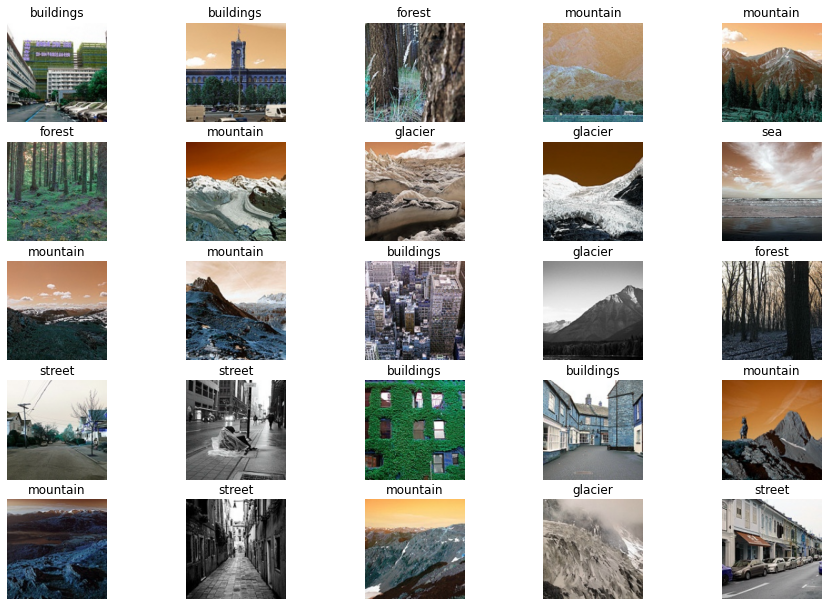

In [ ]:
f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)
for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Images))
        ax[i,j].imshow(Images[rnd_number])
        ax[i,j].set_title(get_classlabel(Labels[rnd_number]))
        ax[i,j].axis('off')

Below is Data Augmentation aplied using ImageDataGenerator


In [ ]:
train_DIR = "/content/seg_train/seg_train/"

train_datagen = ImageDataGenerator( rescale = 1.0/255,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          zoom_range=0.2,
                                          vertical_flip=True,
                                          fill_mode='nearest')


train_generator = train_datagen.flow_from_directory(train_DIR,
                                                    batch_size=32,
                                                    class_mode='categorical',
                                                    target_size=(imgsize, imgsize))

test_DIR = "/content/seg_test/seg_test/"

validation_datagen = ImageDataGenerator(rescale = 1.0/255)


validation_generator = validation_datagen.flow_from_directory(test_DIR,
                                                    batch_size=128,
                                                    class_mode='categorical',
                                                    target_size=(imgsize, imgsize),
                                                    shuffle=False
                                                    )


Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
validation_generator.classes

array([0, 0, 0, ..., 5, 5, 5], dtype=int32)

In [ ]:
%cd seg_pred/
!ls -la

/content/sample_data/seg_pred/seg_pred
total 224
drwxr-xr-x 8 root root  4096 Dec 30 16:50 .
drwxr-xr-x 3 root root  4096 Dec 30 17:06 ..
drwxr-xr-x 2 root root 36864 Dec 30 17:02 buildings
drwxr-xr-x 2 root root 36864 Dec 30 16:59 forest
drwxr-xr-x 2 root root 36864 Dec 30 16:59 glacier
drwxr-xr-x 2 root root 36864 Dec 30 16:59 mountain
drwxr-xr-x 2 root root 36864 Dec 30 16:59 sea
drwxr-xr-x 3 root root 36864 Dec 30 17:02 street


Using pre-Trained MobileNetV2 from Keras, Training last 4 layers only


In [ ]:
mnetv2= MobileNetV2(include_top= False, input_shape=(imgsize,imgsize,3))

mnetv2.summary()

9412608/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 80, 80, 32)   0           bn_Conv1[0][0]                   
________________

In [ ]:
for layer in mnetv2.layers[:-4]:
 	layer.trainable = False

Observing lastt layer and its shape

In [ ]:
last_layer = mnetv2.get_layer('out_relu')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 5, 5, 1280)


Functional Apprach : addig two more layers

1.Gobal pooling
2. Dense layere(equal to no. of classes to predict)
3.ActivTION= HIGHEST PROB(softmax)

In [ ]:
x = tf.keras.layers.GlobalAveragePooling2D()(last_output)
x = tf.keras.layers.Dense  (6, activation = tf.nn.softmax)(x)
#append with model
mnetv2 = tf.keras.Model( mnetv2.input, x)

In [ ]:
mnetv2.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         input_3[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 80, 80, 32)   0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

Now, train last 4 layers

optimizr type,Adam
& set adaptive learning rate

In [ ]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',
                                            patience=1,
                                            verbose=1,
                                            factor=0.25,
                                            min_lr=0.000003)

mnetv2.compile(loss = 'categorical_crossentropy', optimizer= tf.keras.optimizers.Adam(), metrics=['acc'])
#mnetv2.summary()

Now,lets Train

In [ ]:
history = mnetv2.fit(train_generator,
                    epochs = 10,
                    verbose = 1,
                   validation_data = validation_generator,
                   callbacks=[learning_rate_reduction])

Epoch 1/10
439/439 [==============================] - 87s 197ms/step - loss: 0.3533 - acc: 0.8685 - val_loss: 0.3274 - val_acc: 0.8987
Epoch 2/10
439/439 [==============================] - 86s 196ms/step - loss: 0.3116 - acc: 0.8833 - val_loss: 0.2777 - val_acc: 0.9187
Epoch 3/10
439/439 [==============================] - 86s 196ms/step - loss: 0.2941 - acc: 0.8911 - val_loss: 0.2825 - val_acc: 0.9077

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 4/10
439/439 [==============================] - 86s 196ms/step - loss: 0.2482 - acc: 0.9079 - val_loss: 0.2477 - val_acc: 0.9200
Epoch 5/10
439/439 [==============================] - 86s 196ms/step - loss: 0.2360 - acc: 0.9121 - val_loss: 0.2271 - val_acc: 0.9223
Epoch 6/10
439/439 [==============================] - 86s 196ms/step - loss: 0.2271 - acc: 0.9142 - val_loss: 0.2231 - val_acc: 0.9203

Epoch 00006: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 7/10
439/439 [=========

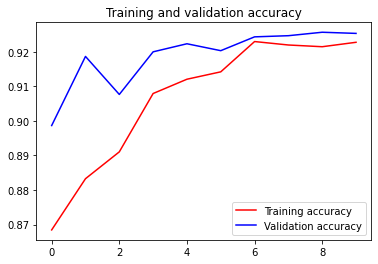

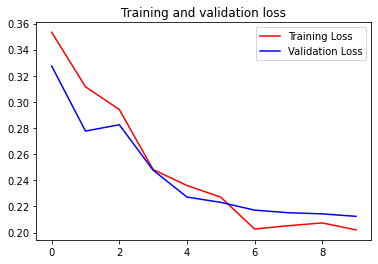

In [ ]:
%matplotlib inline
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## As, visually observed from above graph, the best accuracy is acheived on 9 epochs : 92.57%

In [ ]:
classes=['buildings','forest','glacier','mountain','sea','street']

y_true = validation_generator.classes
predictions = mnetv2.predict_generator(validation_generator)
y_pred = np.array([np.argmax(xin) for xin in predictions])
cm=confusion_matrix(y_true, y_pred)
print(cm)
report = metrics.classification_report(y_true, y_pred, target_names=classes)
print(report)    

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


[[401   1   0   1   1  33]
 [  0 470   2   1   0   1]
 [  1   2 486  51  11   2]
 [  0   2  64 456   2   1]
 [  4   1   9   7 489   0]
 [ 26   0   0   1   0 474]]
              precision    recall  f1-score   support

   buildings       0.93      0.92      0.92       437
      forest       0.99      0.99      0.99       474
     glacier       0.87      0.88      0.87       553
    mountain       0.88      0.87      0.88       525
         sea       0.97      0.96      0.97       510
      street       0.93      0.95      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



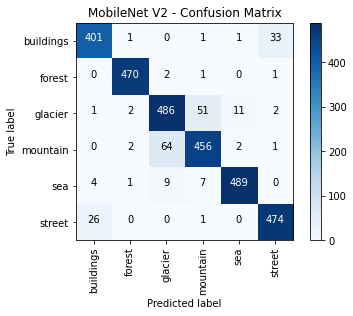

In [ ]:
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('MobileNet V2 - Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=90)
plt.yticks(tick_marks, classes)
plt.ylabel('True label')
plt.xlabel('Predicted label') 
#plt.tight_layout()

import itertools
fmt = 'd'
thresh = cm.max()/2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
 
  


In [ ]:
mnetv2.save('/content/gdrive/MyDrive/Assignment3_CNN/Mobilenetv2.h5')


In [ ]:
import numpy as np
from keras.preprocessing import image
from tensorflow import keras

model = keras.models.load_model('/content/gdrive/MyDrive/Assignment3_CNN/Mobilenetv2.h5')

make predition on single image

Prediction for this image is : buildings


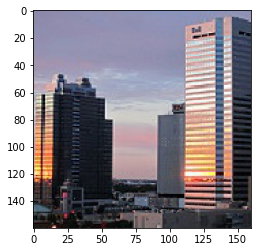

In [ ]:
file_path =  '/content/seg_pred/seg_pred/5.jpg'

test_image = image.load_img(file_path, target_size = (160, 160))
plt.imshow(test_image)
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = mnetv2.predict(test_image)

classes=train_generator.class_indices

classes=['buildings','forest','glacier','mountain','sea','street']

print("Prediction for this image is :",classes[np.argmax(result)])

Making few predictions from the folder

In [ ]:
def get_pred_images(directory):
  Pred_Images = []
  for image_file in os.listdir(directory): #Extracting the file name of the image from Class Label folder
    image = cv2.imread(directory+r'/'+image_file) #Reading the image (OpenCV)
    image = cv2.resize(image,(imgsize,imgsize)) #Resize the image, Some images are different sizes. (Resizing is very Important)
    Pred_Images.append(image)

  return shuffle(Pred_Images,random_state=False)#817328462) #Shuffle the dataset you just prepared.

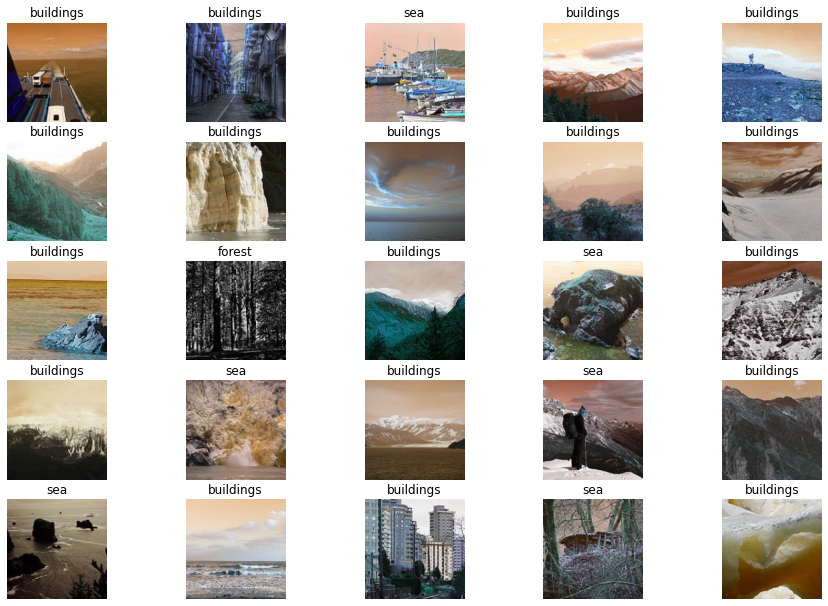

In [ ]:
Pred_Images = get_pred_images('/content/seg_pred/seg_pred/') #Extract the training images from the folders.
classes=train_generator.class_indices
classes=['buildings','forest','glacier','mountain','sea','street']


f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Pred_Images))
        ax[i,j].imshow(Pred_Images[rnd_number])
        
        test_image = Pred_Images[rnd_number]
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        result = mnetv2.predict(test_image)

        ax[i,j].set_title(classes[np.argmax(result)])
        ax[i,j].axis('off')

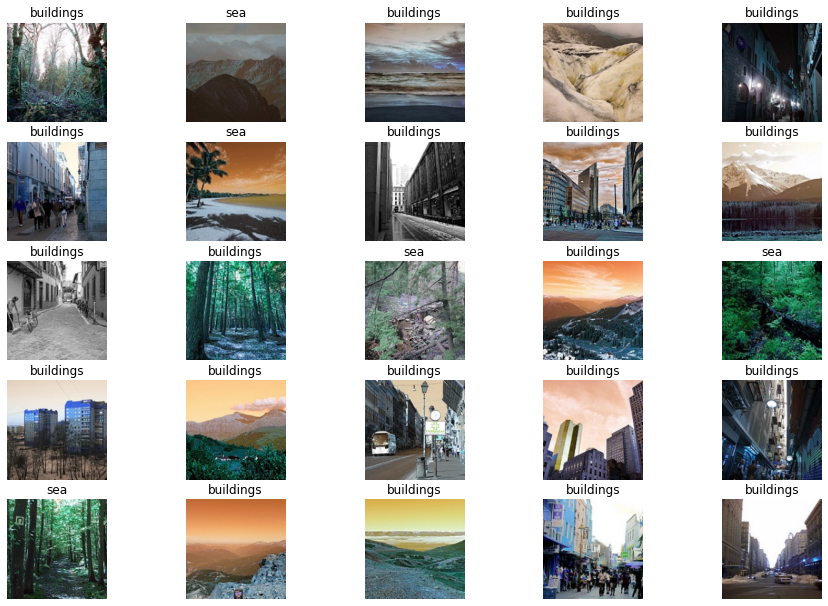

In [ ]:
Pred_Images = get_pred_images('/content/seg_pred/seg_pred/') #Extract the training images from the folders.
classes=train_generator.class_indices
classes=['buildings','forest','glacier','mountain','sea','street']


f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Pred_Images))
        ax[i,j].imshow(Pred_Images[rnd_number])
        
        test_image = Pred_Images[rnd_number]
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        result = mnetv2.predict(test_image)

        ax[i,j].set_title(classes[np.argmax(result)])
        ax[i,j].axis('off')

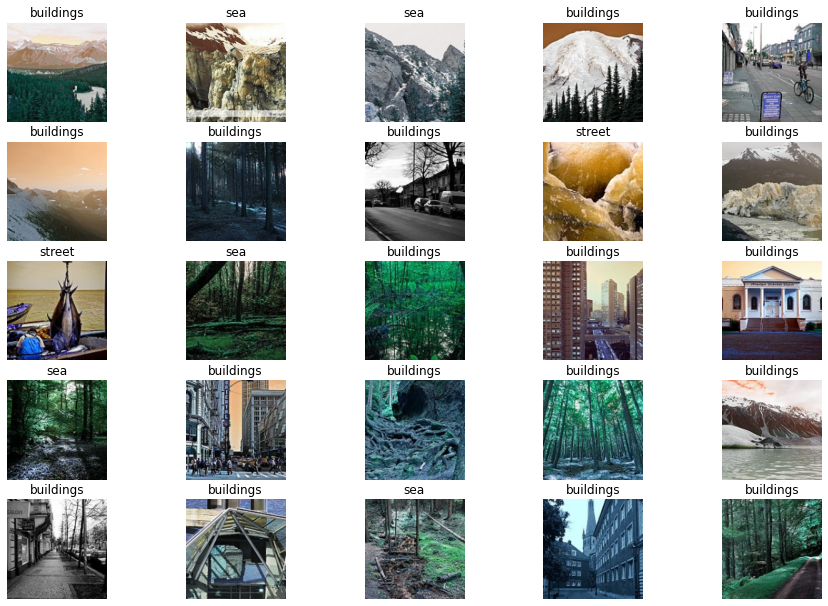

In [ ]:
Pred_Images = get_pred_images('/content/seg_pred/seg_pred/') #Extract the training images from the folders.
classes=train_generator.class_indices
classes=['buildings','forest','glacier','mountain','sea','street']


f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Pred_Images))
        ax[i,j].imshow(Pred_Images[rnd_number])
        
        test_image = Pred_Images[rnd_number]
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        result = mnetv2.predict(test_image)

        ax[i,j].set_title(classes[np.argmax(result)])
        ax[i,j].axis('off')

**New method to Predict**

In [15]:
%cd /
%cd content/
!ls -la

/
/content
total 20
drwxr-xr-x 1 root root 4096 Jan 12 16:15 .
drwxr-xr-x 1 root root 4096 Jan 12 16:11 ..
drwxr-xr-x 1 root root 4096 Jan  8 17:11 .config
drwx------ 6 root root 4096 Jan 12 16:15 gdrive
drwxr-xr-x 1 root root 4096 Jan  6 18:10 sample_data


In [16]:
!cp -r  /content/gdrive/MyDrive/Assignment3_CNN/test_Nature_dataset.zip "/content/test_Nature_dataset.zip"
!unzip -q test_Nature_dataset.zip

In [ ]:
# %cd /content/gdrive/MyDrive/Assignment3_CNN
!ls -la

total 461028
drwxr-xr-x 1 root root      4096 Jan  8 10:04 .
drwxr-xr-x 1 root root      4096 Jan  8 09:48 ..
drwxr-xr-x 1 root root      4096 Jan  6 18:10 .config
drwx------ 6 root root      4096 Jan  8 10:02 gdrive
-rw------- 1 root root 363152213 Jan  8 10:03 Nature_dataset.zip
drwxr-xr-x 1 root root      4096 Jan  6 18:10 sample_data
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_pred
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_test
drwxr-xr-x 3 root root      4096 Jan  8 10:03 seg_train
-rw------- 1 root root 108897587 Jan  8 10:04 test_Nature_dataset.zip


In [ ]:
# %cd Assignment3_CNN

In [13]:
import numpy as np
from keras.preprocessing import image
from tensorflow import keras
import os
import cv2
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
from random import randint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

mnetv2 = keras.models.load_model('/content/gdrive/MyDrive/Assignment3_CNN/Mobilenetv2.h5')

In [ ]:
!ls -la

total 461028
drwxr-xr-x 1 root root      4096 Jan  7 17:23 .
drwxr-xr-x 1 root root      4096 Jan  7 16:44 ..
drwxr-xr-x 1 root root      4096 Dec 21 17:29 .config
drwx------ 6 root root      4096 Jan  7 16:50 gdrive
-rw------- 1 root root 363152213 Jan  7 17:20 Nature_dataset.zip
drwxr-xr-x 1 root root      4096 Dec 21 17:29 sample_data
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_pred
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_test
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_train
-rw------- 1 root root 108897587 Jan  7 17:23 test_Nature_dataset.zip


In [17]:
# pred_dir =  '/content/gdrive/MyDrive/Assignment3_CNN/seg_pred/seg_pred'
pred_dir =  '/content/seg_pred/seg_pred'

test_datagen = ImageDataGenerator(rescale=1. / 255)
batch=7300         #decides batch on images picked from pred

test_generator = test_datagen.flow_from_directory(
    directory=pred_dir,
    target_size=(160, 160),
    color_mode="rgb",
    batch_size=batch,
    class_mode=None,
    shuffle=True       #false 
)

Found 7301 images belonging to 6 classes.


In [18]:
a=test_generator.next()
print(a.shape)

(7300, 160, 160, 3)


In [19]:
test_generator.reset()
pred=mnetv2.predict_generator(a,verbose=1,steps=7300/730) #this will decide the predictions size
# pred=mnetv2.predict_generator(a,verbose=1,steps=7300/730)#7301/7301)     #/batch) #this will decide the predictions size

predicted_class_indices=np.argmax(pred,axis=1)

#labels = (train_generator.class_indices)        #names from training is right

labels={'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]
print(len(predictions))

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


10/10 [==============================] - 15s 676ms/step
7300


Random testing & observation of predictions on our test set

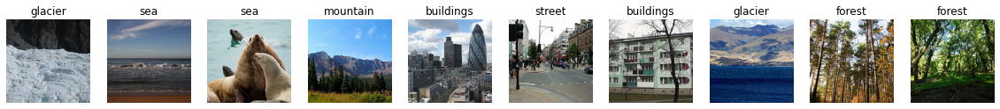

In [ ]:
%matplotlib inline

k=0              #index for picking images from pred sequence can be from 0 to 7299
columns = 10
total=10        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1





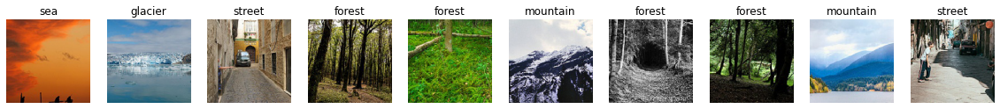

In [ ]:
%matplotlib inline

k=0              #index for picking images from pred sequence can be from 0 to 7299
columns = 10
total=10        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1





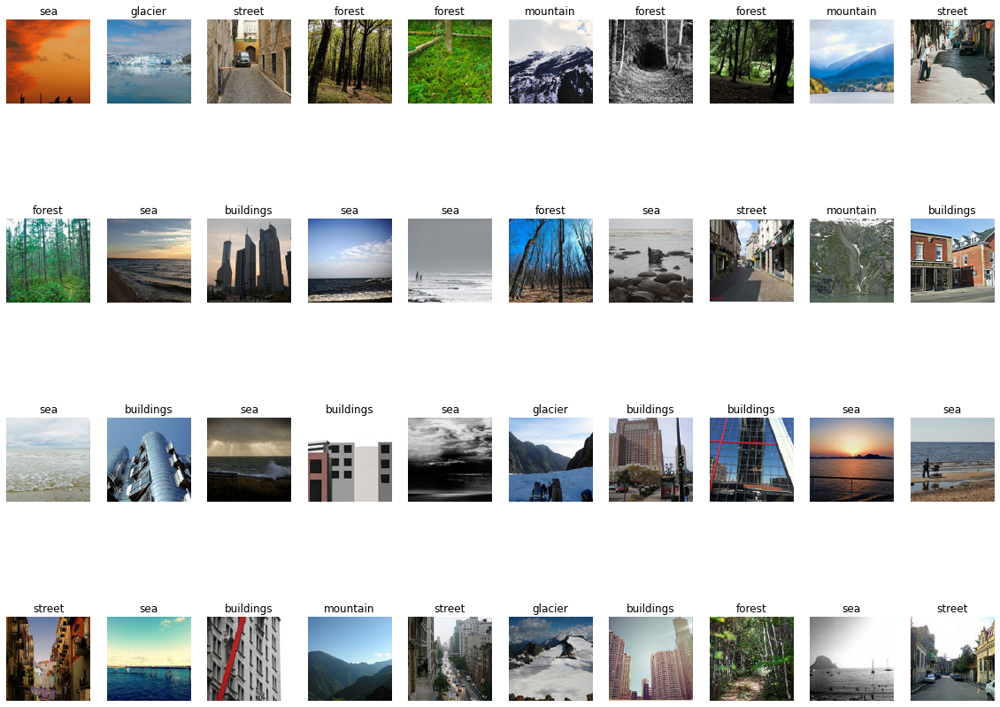

In [ ]:
%matplotlib inline

k=0              #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1





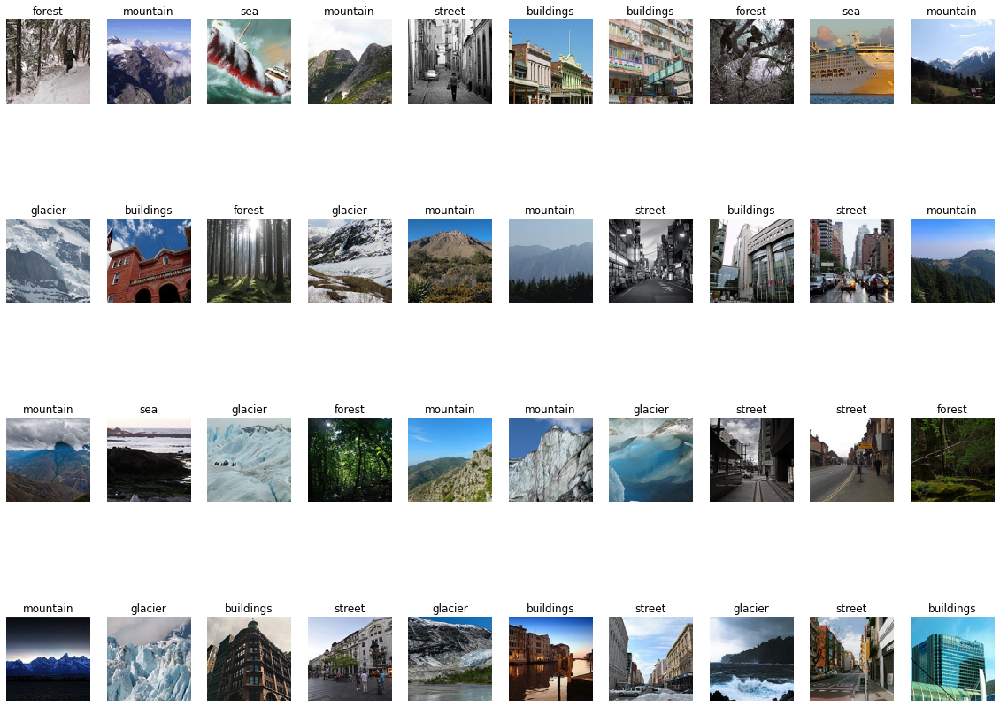

In [ ]:
%matplotlib inline

k=1300              #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


**Pick ordered images**


In [20]:
pred_dir =  '/content/seg_pred/seg_pred'

test_datagen = ImageDataGenerator(rescale=1. / 255)
batch=7300         #decides batch on images picked from pred
test_generator = test_datagen.flow_from_directory(
    directory=pred_dir,
    target_size=(160, 160),
    color_mode="rgb",
    batch_size=batch,
    class_mode=None,
    shuffle= False # Pick images as placed in folder
)

Found 7301 images belonging to 6 classes.


In [21]:
a=test_generator.next()
print(a.shape)

(7300, 160, 160, 3)


In [22]:
test_generator.reset()
pred=mnetv2.predict_generator(a,verbose=1,steps=7300/730) #this will decide the predictions size
# pred=mnetv2.predict_generator(a,verbose=1,steps=7300/730)#7301/7301)     #/batch) #this will decide the predictions size

predicted_class_indices=np.argmax(pred,axis=1)

#labels = (train_generator.class_indices)        #names from training is right

labels={'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]
print(len(predictions))

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


10/10 [==============================] - 7s 733ms/step
7300


Following images are for comparison report

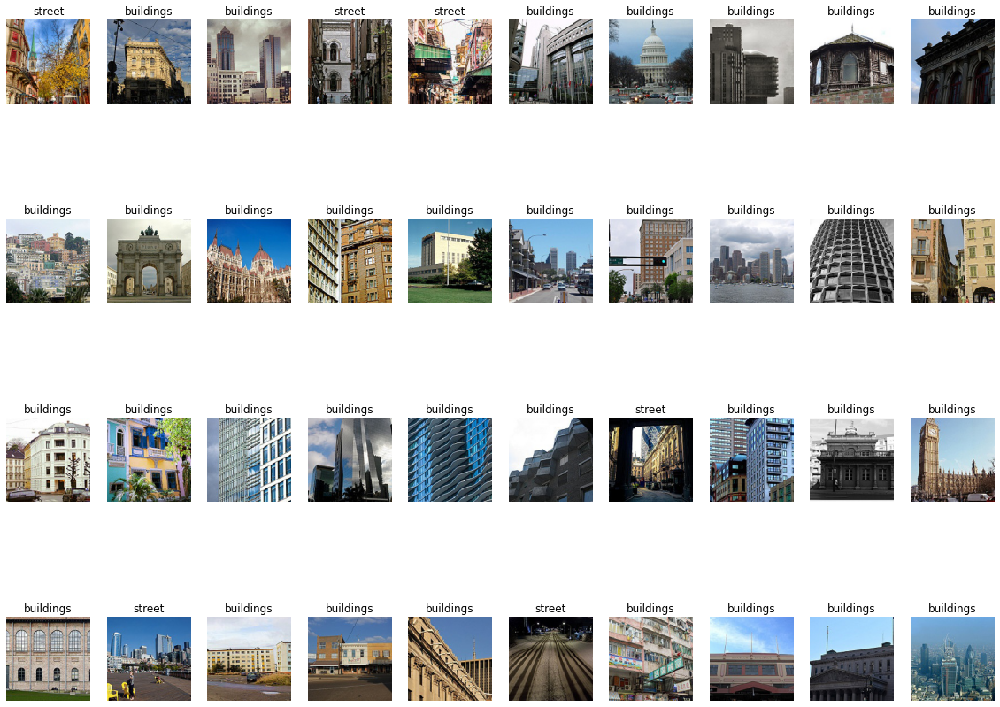

In [23]:
%matplotlib inline

k= 00             #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


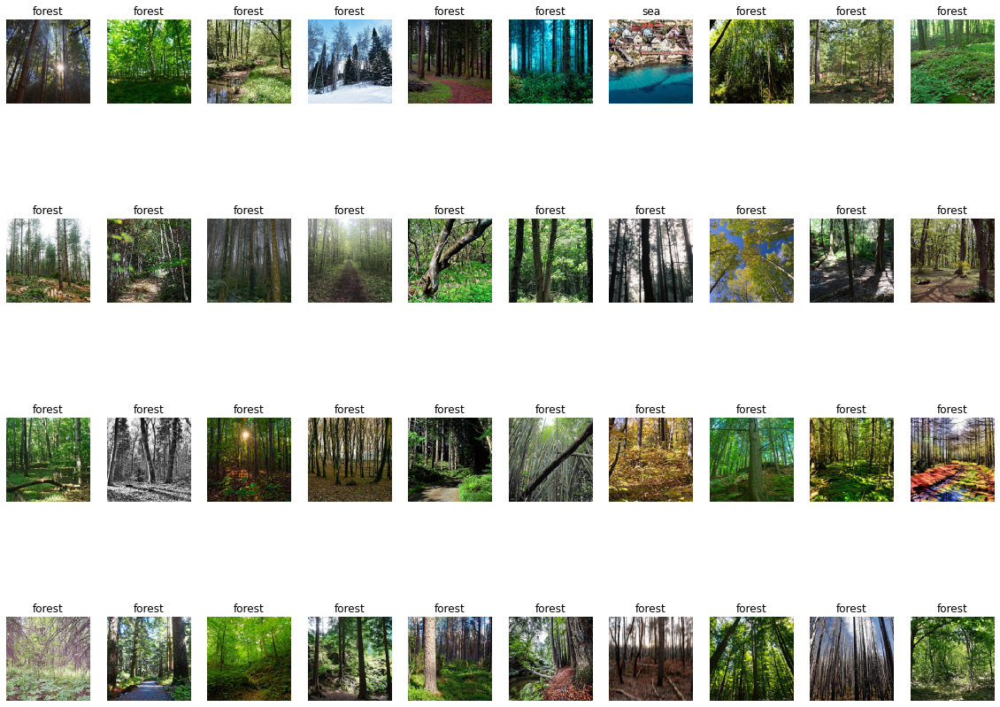

In [ ]:
%matplotlib inline

k= 1500             #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


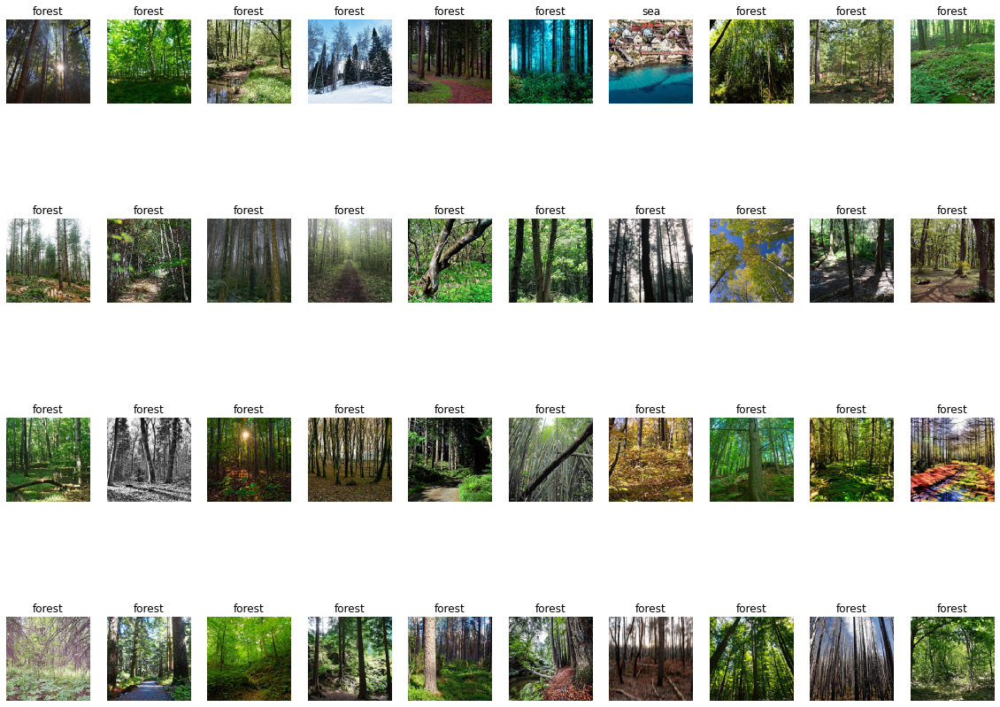

In [ ]:
%matplotlib inline

k= 1500             #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


In [ ]:
predicted_class_indices.shape

(7300,)

In [ ]:
y_true=test_generator.labels

In [ ]:
cm=confusion_matrix(y_true[0:7300], predicted_class_indices)


In [ ]:
cm

array([[1020,    5,    4,    1,   11,  103],
       [   4, 1146,    4,    6,    3,    3],
       [   2,    4, 1135,  136,   50,    3],
       [   6,    8,  177, 1032,   70,    4],
       [   7,    3,   38,   44, 1021,   15],
       [  62,   11,    3,    2,    9, 1148]])

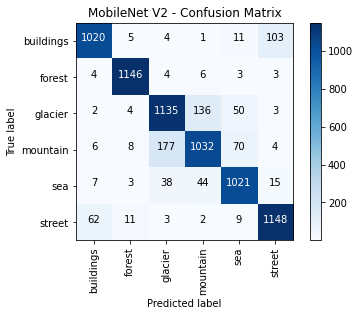

In [ ]:

labels={'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('MobileNet V2 - Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(6)
plt.xticks(tick_marks, labels, rotation=90)
plt.yticks(tick_marks, labels)
plt.ylabel('True label')
plt.xlabel('Predicted label') 
#plt.tight_layout()

import itertools
fmt = 'd'
thresh = cm.max()/2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
 
  

In [ ]:
filenames=test_generator.filenames



In [ ]:
len(filenames)

7301

In [ ]:
import  pandas as pd
results=pd.DataFrame({"Filename":filenames[0:7300],
                      "Predictions":predictions})

In [ ]:
df=results.to_csv
('/content/gdrive/MyDrive/Assignment3_CNN/MobileNetV2_results.csv')

In [ ]:
results

,Filename,Predictions
0,buildings/10004.jpg,street
1,buildings/10048.jpg,buildings
2,buildings/10052.jpg,buildings
3,buildings/10073.jpg,street
4,buildings/10082.jpg,street
...,...,...
7295,street/9950.jpg,street
7296,street/9963.jpg,street
7297,street/9972.jpg,street
7298,street/9987.jpg,street


In [ ]:
%cd gdrive/MyDrive/Assignment3_CNN/
!ls -la

/content/gdrive/MyDrive/Assignment3_CNN
total 485982
-rw------- 1 root root   1778449 Jan  6 20:59 Inception.ipynb
-rw------- 1 root root    358165 Jan  7 12:49 Inceptionv3_predfix.ipynb
-rw------- 1 root root  12914632 Jan  6 20:04 Mobilenetv2.h5
-rw------- 1 root root  10315704 Jan  7 17:59 Mobilenetv2.ipynb
-rw------- 1 root root 363152213 Jan  6 19:02 Nature_dataset.zip
-rw------- 1 root root    214838 Jan  7 17:58 results.csv
drwx------ 3 root root      4096 Jan  7 12:57 seg_pred
drwx------ 3 root root      4096 Jan  7 16:53 seg_test
drwx------ 3 root root      4096 Jan  7 16:54 seg_train
-rw------- 1 root root 108897587 Jan  6 19:01 test_Nature_dataset.zip


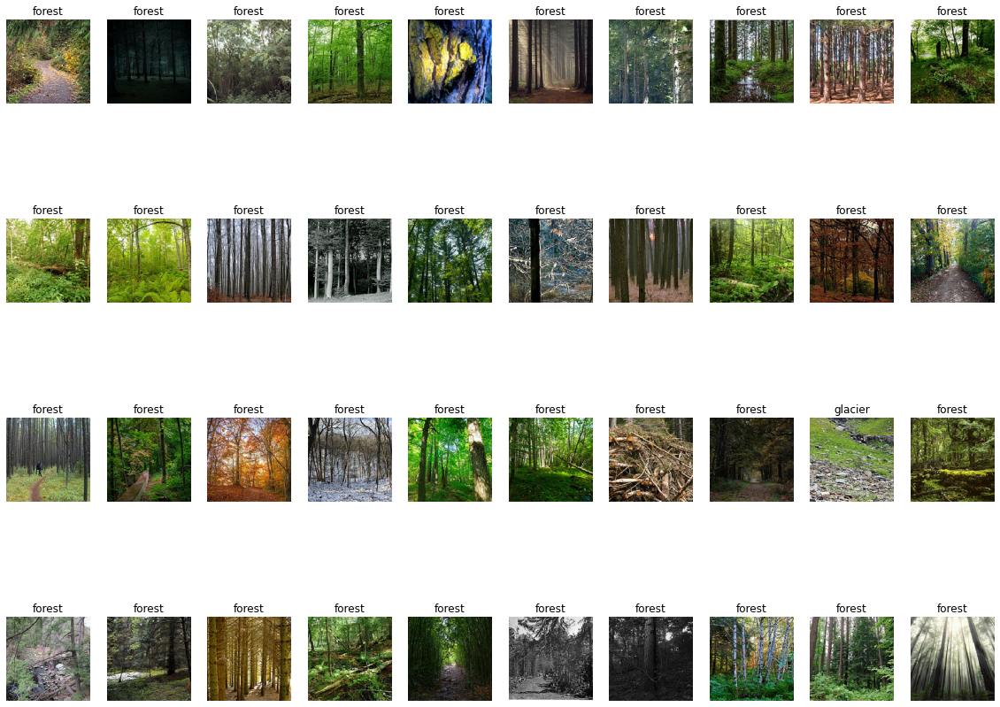

In [ ]:
%matplotlib inline

k=1300              #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


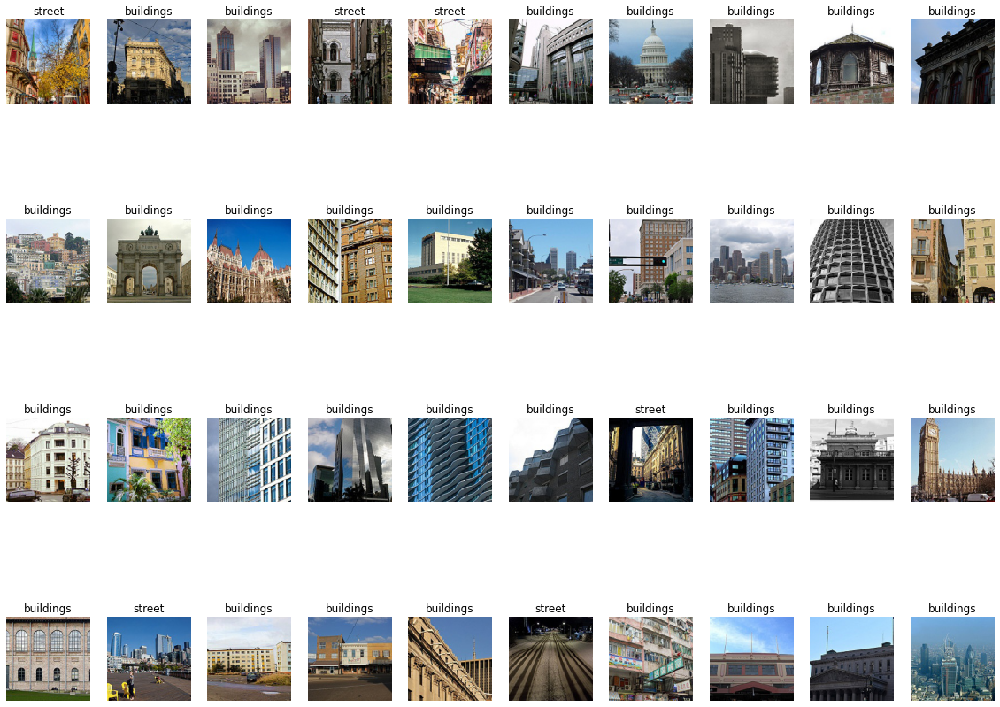

In [ ]:
%matplotlib inline

k=00              #index for picking images from pred sequence can be from 0 to 7299
# 1200
columns = 10
total=40        #total images you want to display for visualization
plt.figure(figsize=(20,20))

for i in range(0,total,1):
    plt.subplot(total / columns + 1, columns, i + 1)
    plt.imshow(a[k])
    plt.title(predictions[k])
    plt.axis('off')
    k=k+1


In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(mnetv2, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Output hidden; open in https://colab.research.google.com to view.

**END**

In [ ]:
classes=train_generator.class_indices
classes

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

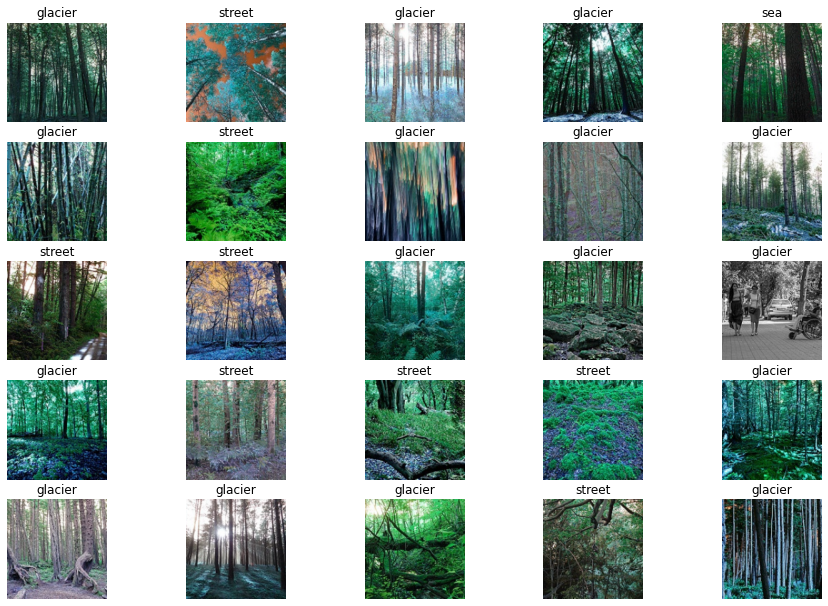

In [ ]:

Pred_Images = get_pred_images('/content/sample_data/seg_pred/seg_pred/forest') #Extract the training images from the folders.
#classes=train_generator.class_indices
classes=['glacier','sea','buildings','forest','street','mountain']
#classes = {2:'glacier', 4:'sea', 0:'buildings', 1:'forest', 5:'street', 3:'mountain'}
#classes=[0,1,2,3,4,5]

f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Pred_Images))
        ax[i,j].imshow(Pred_Images[rnd_number])
        
        test_image = Pred_Images[rnd_number]
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        result = mnetv2.predict(test_image)
        ax[i,j].set_title(classes[np.argmax(result)])
        ax[i,j].axis('off')

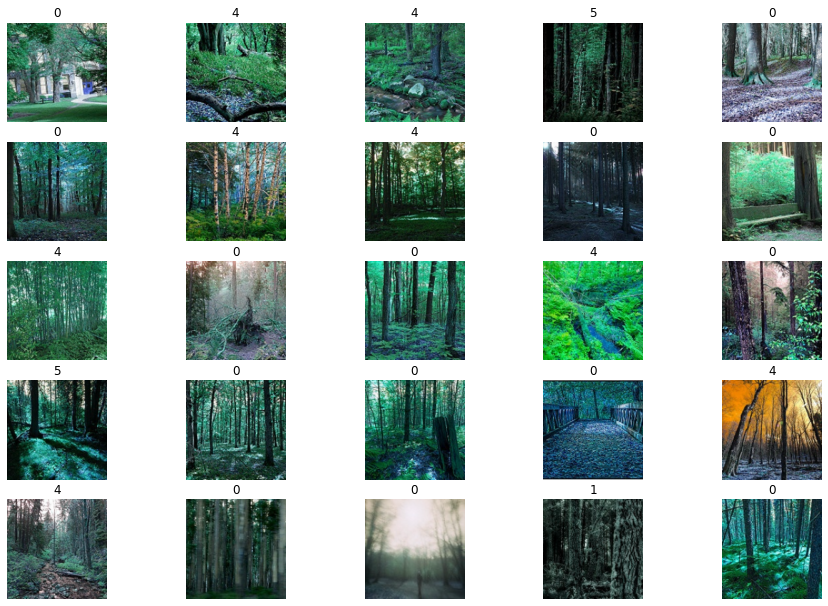

In [ ]:
Pred_Images = get_pred_images('/content/sample_data/seg_pred/seg_pred/forest') #Extract the training images from the folders.
#classes=train_generator.class_indices
# classes=['buildings','forest','glacier','mountain','sea','street']
classes=[0,1,2,3,4,5]

f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Pred_Images))
        ax[i,j].imshow(Pred_Images[rnd_number])
        
        test_image = Pred_Images[rnd_number]
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        result = mnetv2.predict(test_image)
        ax[i,j].set_title(classes[np.argmax(result)])
        ax[i,j].axis('off')

In [ ]:
a

array([[4.5951167e-01, 2.9564166e-04, 1.7587050e-05, 1.5328254e-06,
        5.3340524e-01, 6.7683929e-03]], dtype=float32)

In [ ]:
np.argmax(a)

4

In [ ]:
classes[4]

KeyError: ignored

Inception


In [ ]:
%cd content/gdrive/MyDrive/
!ls -la

In [ ]:
%cd /
%cd content/
!ls -la


/
/content
total 461028
drwxr-xr-x 1 root root      4096 Jan  7 17:23 .
drwxr-xr-x 1 root root      4096 Jan  7 16:44 ..
drwxr-xr-x 1 root root      4096 Dec 21 17:29 .config
drwx------ 6 root root      4096 Jan  7 16:50 gdrive
-rw------- 1 root root 363152213 Jan  7 17:20 Nature_dataset.zip
drwxr-xr-x 1 root root      4096 Dec 21 17:29 sample_data
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_pred
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_test
drwxr-xr-x 3 root root      4096 Jan  7 17:21 seg_train
-rw------- 1 root root 108897587 Jan  7 17:23 test_Nature_dataset.zip
